# Part 1f - Finfing pupil - pipeline

## Setup

In [1]:
import os
import random
import re

import math
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches

import cv2
from PIL import Image

## Functions

In [2]:
# Loading and preview ------------------------------------------------

def load_images_ending_with_pattern(folder_path, regex):
    images = []
    pattern = re.compile(regex)

    for root, _, files in os.walk(folder_path):
        for file in files:
            if not pattern.match(file):
                continue
            file_path = os.path.join(root, file)
            try:
                with Image.open(file_path) as img:
                    img.verify()
                image = cv2.imread(file_path, cv2.IMREAD_COLOR)
                if image is not None:
                    images.append(image)
            except Exception:
                print(f"Skipping non-image file: {file_path}")
    return images

def preview_images(images, num_previews=5):
    if not images:
        print("No images to display.")
        return

    num_previews = min(num_previews, len(images))
    selected_images = images[:num_previews]
    
    cols = min(15, num_previews)
    rows = math.ceil(num_previews / 15)
    
    plt.figure(figsize=(cols * 3, rows * 3))
    for i, img in enumerate(selected_images):
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_rgb)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Resizing -----------------------------------------------------------

def resize_images(images, max_size=256):
    resized = []
    for img in images:
        h, w = img.shape[:2]
        scale = max_size / max(h, w)
        new_size = (int(w * scale), int(h * scale))  # (width, height)
        resized_img = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
        resized.append(resized_img)
    return resized

# Correcting poor quality image --------------------------------------

def apply_clahe(gray, clip_limit=2.0, tile_grid_size=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(gray)
    
def preprocess_for_pupil(gray):
    # 1) CLAHE contrast boost
    gray = apply_clahe(gray, clip_limit=2.0)
    # 2) remove small bright glints
    #    a) top‑hat subtraction
    r = max(3, int(min(gray.shape)*0.02) // 2 * 2 + 1)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (r,r))
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel)
    gray = cv2.subtract(gray, tophat)
    # 3) median smoothing
    gray = cv2.medianBlur(gray, 5)
    # 4) optional: inpaint large residual highlights
    _, mask = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)
    mask = cv2.dilate(mask, kernel, iterations=2)
    gray = cv2.inpaint(gray, mask, 3, cv2.INPAINT_TELEA)
    return gray

# Greyscale ----------------------------------------------------------

def convert_images_to_greyscale(images):
    grey_images = []
    for img in images:
        if len(img.shape) == 3:
            grey_img = np.mean(img, axis=2).astype(img.dtype)
        else:
            grey_img = img.copy()
        grey_images.append(grey_img)
    return grey_images

# Binarization -------------------------------------------------------

def adaptive_binarize_pupil(
    grey_images,
    initial_factor,
    white_ratio_thresh=0.9,
    min_factor=1.0,
    factor_step=0.5,
    verbose=False
):
    pupil_binaries = []

    for idx, grey in enumerate(grey_images):
        X = initial_factor
        while True:

            #------------------------------------------
            # Image sizes
            h, w = grey.shape
            # Treshold based on mean
            P = np.sum(grey) / (h * w)
            # Modified treshold
            P = P / X
            # Binarization
            bin_image = np.zeros_like(grey, dtype=np.uint8)
            bin_image[grey >= P] = 255
            #------------------------------------------

            white_ratio = np.mean(bin_image == 255)
            if white_ratio > white_ratio_thresh and (X - factor_step) >= min_factor:
                new_X = round(X - factor_step, 2)
                if verbose:
                    print(
                        f"Image {idx}: white ratio {white_ratio:.3f} > {white_ratio_thresh}, "
                        f"lowering factor {X:.2f} → {new_X:.2f} and retrying"
                    )
                X = new_X
                continue
            break

        # Print final threshold if not verbose
        if not verbose:
            print(
                f"Image {idx}: final threshold P/X = {P/X:.2f} (factor X = {X:.2f}), "
                f"white ratio = {white_ratio:.3f}"
            )

        pupil_binaries.append(bin_image)

    return pupil_binaries

# Morphologial operations --------------------------------------------

def get_structuring_element(shape, ksize, anchor=None):
    rows, cols = ksize
    if anchor is None:
        anchor = (rows // 2, cols // 2)
    if shape.lower() == "rect":
        kernel = np.ones((rows, cols), dtype=np.uint8)
    elif shape.lower() == "ellipse":
        kernel = np.zeros((rows, cols), dtype=np.uint8)
        # Use the center of the kernel for ellipse definition.
        cy, cx = rows // 2, cols // 2  
        a = rows / 2.0
        b = cols / 2.0
        for i in range(rows):
            for j in range(cols):
                # Equation of ellipse centered at (cy, cx)
                if ((i - cy) / a)**2 + ((j - cx) / b)**2 <= 1:
                    kernel[i, j] = 1
    elif shape.lower() == "cross":
        kernel = np.zeros((rows, cols), dtype=np.uint8)
        # Place ones in the row and column corresponding to anchor
        ay, ax = anchor
        if 0 <= ay < rows:
            kernel[ay, :] = 1
        if 0 <= ax < cols:
            kernel[:, ax] = 1
    else:
        raise ValueError("Unsupported kernel shape. Choose 'rect', 'ellipse', or 'cross'.")
    return kernel, anchor

def erosion(image, kernel, anchor):
    krows, kcols = kernel.shape
    ay, ax = anchor
    pad_top = ay
    pad_bottom = krows - ay - 1
    pad_left = ax
    pad_right = kcols - ax - 1
    padded = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=image.min())
    out = np.zeros_like(image)
    rows, cols = image.shape
    for i in range(rows):
        for j in range(cols):
            region = padded[i:i+krows, j:j+kcols]
            out[i, j] = np.max(region[kernel==1])
    return out

def dilation(image, kernel, anchor):
    krows, kcols = kernel.shape
    ay, ax = anchor
    pad_top = ay
    pad_bottom = krows - ay - 1
    pad_left = ax
    pad_right = kcols - ax - 1
    padded = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=image.max())
    out = np.zeros_like(image)
    rows, cols = image.shape
    for i in range(rows):
        for j in range(cols):
            region = padded[i:i+krows, j:j+kcols]
            out[i, j] = np.min(region[kernel==1])
    return out

def opening(image, kernel, anchor):
    eroded = erosion(image, kernel, anchor)
    opened = dilation(eroded, kernel, anchor)
    return opened

def closing(image, kernel, anchor):
    dilated = dilation(image, kernel, anchor)
    closed = erosion(dilated, kernel, anchor)
    return closed

# Remove artifacts away from center ----------------------------------

def mask_outside_boundary(images, x_thresh=0.9, y_thresh=0.9):
    masked = []
    for img in images:
        h, w = img.shape[:2]
        cx, cy = w/2.0, h/2.0
        dx, dy = x_thresh*(w/2.0), y_thresh*(h/2.0)
        left, right   = cx - dx, cx + dx
        top, bottom   = cy - dy, cy + dy

        # Create a boolean mask of pixels to white‑out:
        ys, xs = np.ogrid[:h, :w]
        outside = (xs < left) | (xs > right) | (ys < top) | (ys > bottom)

        out = img.copy()
        if img.ndim == 2:
            out[outside] = 255
        else:
            out[outside] = (255, 255, 255)
        masked.append(out)
    return masked

# Projections and find center ----------------------------------------

def compute_projections(image):
    h, w = image.shape
    # horizontal & vertical
    h_proj = np.sum(image == 0, axis=1)
    v_proj = np.sum(image == 0, axis=0)

    # main diagonal offsets d = j - i
    d_off = np.arange(-h+1, w)
    d_proj = np.array([
        sum(image[i, i + d] == 0
            for i in range(max(0, -d), min(h, w - d)))
        for d in d_off
    ])

    # anti-diagonal offsets s = i + j
    ad_off = np.arange(0, h + w - 1)
    ad_proj = np.array([
        sum(image[i, s - i] == 0
            for i in range(max(0, s - (w - 1)), min(h, s + 1)))
        for s in ad_off
    ])

    return h_proj, v_proj, d_proj, ad_proj, d_off, ad_off

def get_pupil_centers_from_projections(pupil_projections):
    centers = []

    for (h_proj, v_proj, d_proj, ad_proj, d_off, ad_off) in pupil_projections:
        h = h_proj.shape[0]
        w = v_proj.shape[0]

        # 1) indices of max in each projection
        h_maxs  = np.flatnonzero(h_proj  == h_proj.max())   # y‑coords
        v_maxs  = np.flatnonzero(v_proj  == v_proj.max())   # x‑coords
        d_idxs  = np.flatnonzero(d_proj  == d_proj.max())
        ad_idxs = np.flatnonzero(ad_proj == ad_proj.max())
        d_maxs  = d_off[d_idxs]    # j - i = d
        ad_maxs = ad_off[ad_idxs]  # i + j = s

        pts = []
        # H and V
        for y in h_maxs:
            for x in v_maxs:
                pts.append((x, y))

        # H and D:  j = i + d  → x = y + d
        for y in h_maxs:
            for d in d_maxs:
                pts.append((y + d, y))

        # H and A:  i + j = s → x = s - y
        for y in h_maxs:
            for s in ad_maxs:
                pts.append((s - y, y))

        # V and D:  x = x, y = x - d
        for x in v_maxs:
            for d in d_maxs:
                pts.append((x, x - d))

        # V and A:  x = x, y = s - x
        for x in v_maxs:
            for s in ad_maxs:
                pts.append((x, s - x))

        # D and A:  j = i + d  and  i + j = s
        # -> i = (s - d)/2,  j = i + d
        for d in d_maxs:
            for s in ad_maxs:
                i = (s - d) / 2.0
                j = i + d
                pts.append((j, i))

        # filter to valid image coords
        valid = [(x, y) for x, y in pts if 0 <= x < w and 0 <= y < h]
        if not valid:
            centers.append((None, None))
        else:
            xs, ys = zip(*valid)
            centers.append((float(np.mean(xs)), float(np.mean(ys))))

    return centers

# Find pupil radious -------------------------------------------------

def find_radius_from_projection_edges(projections, centers):
    radii = []

    for (h_proj, v_proj, d_proj, ad_proj, d_off, ad_off), _ in zip(projections, centers):
        # Horizontal (rows) → y direction
        h_indices = np.where(h_proj > 0)[0]
        h_radius = (h_indices[-1] - h_indices[0] + 1) / 2.0 if len(h_indices) > 0 else 0

        # Vertical (columns) → x direction
        v_indices = np.where(v_proj > 0)[0]
        v_radius = (v_indices[-1] - v_indices[0] + 1) / 2.0 if len(v_indices) > 0 else 0

        # Diagonal
        d_indices = np.where(d_proj > 0)[0]
        d_radius = (d_indices[-1] - d_indices[0] + 1) / 2.0 / math.sqrt(2) if len(d_indices) > 0 else 0

        # Anti-diagonal
        ad_indices = np.where(ad_proj > 0)[0]
        ad_radius = (ad_indices[-1] - ad_indices[0] + 1) / 2.0 / math.sqrt(2) if len(ad_indices) > 0 else 0

        radius = np.mean([v_radius, h_radius, d_radius, ad_radius])
        radii.append(radius)

    return radii

# Transfer centers to different size ---------------------------------

def map_center_to_different_image(center, target_shape, source_shape):
    src_h, src_w = source_shape
    tgt_h, tgt_w = target_shape

    x, y = center

    # Compute scaling factors regardless of direction
    scale_x = tgt_w / src_w
    scale_y = tgt_h / src_h

    # Scale and round to integer pixel location
    x_new = int(round(x * scale_x))
    y_new = int(round(y * scale_y))

    return (x_new, y_new)

def map_radius_to_different_image(radius, new_shape, base_shape):
    base_h, base_w = base_shape
    new_h, new_w = new_shape

    # Scale based on average scaling factor from both dimensions
    scale_h = new_h / base_h
    scale_w = new_w / base_w
    scale = (scale_h + scale_w) / 2.0

    return radius * scale

# Showcase -----------------------------------------------------------

def draw_pupil_boundaries(images, centers, radii, color=(0, 0, 255), thickness=2):
    n = len(images)
    cols = min(5, n)
    rows = math.ceil(n / cols)

    plt.figure(figsize=(cols*3, rows*3))
    for i, (img, (cx, cy), r) in enumerate(zip(images, centers, radii)):
        disp = img.copy()
        if disp.ndim == 2:
            disp = cv2.cvtColor(disp, cv2.COLOR_GRAY2BGR)
        cv2.circle(disp, (int(round(cx)), int(round(cy))), int(round(r)), color, thickness)

        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(cv2.cvtColor(disp, cv2.COLOR_BGR2RGB))
        ax.axis('off')

    plt.tight_layout()
    plt.show()

## Pipeline

Image 0: final threshold P/X = 10.18 (factor X = 4.25), white ratio = 0.975
Image 1: final threshold P/X = 10.74 (factor X = 4.05), white ratio = 0.975
Image 2: final threshold P/X = 4.10 (factor X = 6.10), white ratio = 0.975
Image 3: final threshold P/X = 4.10 (factor X = 6.35), white ratio = 0.972
Image 4: final threshold P/X = 13.79 (factor X = 3.45), white ratio = 0.975
Image 5: final threshold P/X = 12.24 (factor X = 3.70), white ratio = 0.974
Image 6: final threshold P/X = 8.69 (factor X = 4.50), white ratio = 0.975
Image 7: final threshold P/X = 7.81 (factor X = 4.50), white ratio = 0.975
Image 8: final threshold P/X = 10.94 (factor X = 3.70), white ratio = 0.974
Image 9: final threshold P/X = 9.84 (factor X = 3.90), white ratio = 0.974
Image 10: final threshold P/X = 10.29 (factor X = 4.20), white ratio = 0.975
Image 11: final threshold P/X = 13.21 (factor X = 3.75), white ratio = 0.975
Image 12: final threshold P/X = 16.82 (factor X = 3.05), white ratio = 0.975
Image 13: fina

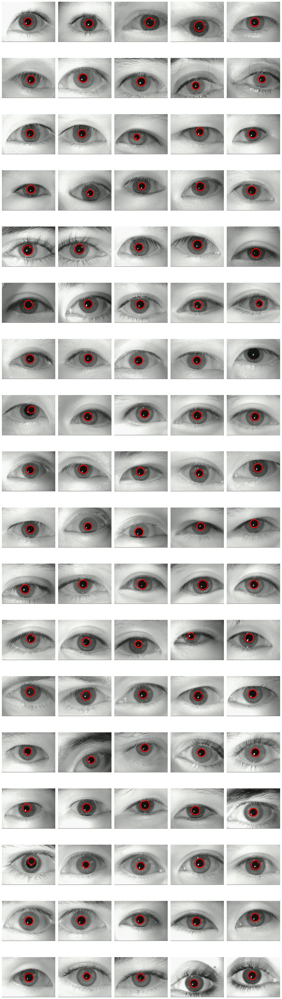

In [3]:
# Loading
images = load_images_ending_with_pattern('MMU-Iris-Database', r'.*[^0-9]?1\.[a-zA-Z]+$')

# Resizing
if images[0].shape[1] > 256:
    resized_images = resize_images(images, max_size=256)
else:
    resized_images = images.copy()

# Greyscale
grey_images = convert_images_to_greyscale(resized_images)

# Binarization
binarized_pupil_images = adaptive_binarize_pupil(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=0.975,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
)

# Closing
kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (5.5/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
closed_pupil_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]

# Opening
kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (10/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
opened_pupil_images = [opening(img, structuring_element, anchor) for img in closed_pupil_images]

# Removing artifacts near border
cleaned_pupil_images = mask_outside_boundary(opened_pupil_images, x_thresh=0.75, y_thresh=0.75)

# Calculating projections, finding pupil centers and radii
pupil_projections = [compute_projections(img) for img in cleaned_pupil_images]
pupil_centers = get_pupil_centers_from_projections(pupil_projections)
pupil_radii = find_radius_from_projection_edges(pupil_projections, pupil_centers)

# Finding new pupil centers and showcasing results
new_pupil_radii = [
    map_radius_to_different_image(radius, img_to_transfer_to.shape[:2], base_img.shape[:2]) 
    for radius, img_to_transfer_to, base_img 
    in zip(pupil_radii, images, cleaned_pupil_images)
]
new_pupil_centers = [
    map_center_to_different_image(center, img_to_transfer_to.shape[:2], base_img.shape[:2]) 
    for center, img_to_transfer_to, base_img
    in zip(pupil_centers, images, cleaned_pupil_images)]
draw_pupil_boundaries(images, new_pupil_centers, new_pupil_radii, thickness=max(2, int(images[0].shape[1]/100)))